In [2]:
#%%
import cellpose
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
mpl.rcParams['figure.dpi'] = 300
# from cellpose import utils, io
import pandas as pd
import numpy as np
from skimage.io import imread
import scipy as sp
from scipy.signal import savgol_filter
from scipy.optimize import linear_sum_assignment
from scipy.spatial.distance import cdist
from skimage.measure import regionprops
from collections import Counter
import networkx as nx
from skimage.segmentation import find_boundaries
import imageio
from cellpose.models import CellposeModel
from skimage.exposure import match_histograms


plt.rcParams["figure.figsize"] = (3,3)
plt.rcParams["figure.dpi"] = 100

%matplotlib inline

In [3]:
cellpose.core.use_gpu()

True

In [4]:
data_directory='/n/boslfs02/LABS/murray_lab/Users/pnanda/DCS/Manuscript/eDCS035_PercevalHR_SEP_Full/'
save_directory='/n/home01/pnandabbs/DCS/Manuscript/Figure1/Figure1A_ATP_ADP/Masks/'

In [5]:
model = CellposeModel(gpu=True, model_type='cyto2')
chan = [[0,0]]

model_type argument is not used in v4.0.1+. Ignoring this argument...


In [6]:
files=os.listdir(data_directory)

In [7]:
from scipy.ndimage import grey_dilation

def rolling_ball_subtract(stack, radius=50):

    from scipy.ndimage import grey_dilation, grey_erosion
    
    corrected = np.zeros_like(stack, dtype=np.float32)
    
    # Create structuring element (sphere/ball)
    y, x = np.ogrid[-radius:radius+1, -radius:radius+1]
    struct = (x**2 + y**2 <= radius**2).astype(np.uint8)
    
    for i in range(stack.shape[0]):
        frame = stack[i].astype(np.float32)
        
        # Estimate background via morphological opening
        # (minimum filter approximates rolling ball)
        bg = grey_erosion(frame, footprint=struct)
        bg = grey_dilation(bg, footprint=struct)
        
        # Subtract and clip at 0
        corrected[i] = np.maximum(frame - bg, 0)
    
    return corrected


In [8]:
def linear_regression_pH_perceval(x,m,c):
    return m*x+c

# popt,pcov=sp.optimize.curve_fit(linear_regression_pH_perceval,ph_mean_calib,per_mean_calib)

In [9]:
def process_masks(masks_list):

    all_properties = []
    for frame_idx, mask in enumerate(masks_list):
        properties = regionprops(mask)
        for prop in properties:
            all_properties.append({
                'frame': frame_idx,
                'label': prop.label,
                'centroid': prop.centroid,
                'area': prop.area,
                'bbox': prop.bbox,
                'radius': prop.feret_diameter_max
            })

    properties_df_raw = pd.DataFrame(all_properties)

    tracks = []
    # Define a distance threshold (you might need to adjust this value)
    distance_threshold = 100 # Example threshold, in pixels

    properties_df=properties_df_raw[(properties_df_raw['area']<500) & (properties_df_raw['area']>200)]

    for i in range(1, len(masks_list)):
        prev_frame_props = properties_df[properties_df['frame'] == i - 1].reset_index(drop=True)
        curr_frame_props = properties_df[properties_df['frame'] == i].reset_index(drop=True)

        if prev_frame_props.empty or curr_frame_props.empty:
            # If either frame is empty, no tracking is possible for this frame pair
            # We still need to initialize tracks for objects in the current frame that don't have a previous match
            if not curr_frame_props.empty:
                 for idx, row in curr_frame_props.iterrows():
                    # Assign a new track ID to objects in the current frame if the previous frame was empty
                     tracks.append({
                        'prev_frame_label': None, # No previous frame match
                        'curr_frame_label': row['label'],
                        'frame': i

                    })
            continue


        prev_centroids = np.array([c for c in prev_frame_props['centroid']])
        curr_centroids = np.array([c for c in curr_frame_props['centroid']])

        distance_matrix = cdist(prev_centroids, curr_centroids)

        row_ind, col_ind = linear_sum_assignment(distance_matrix)



        # Store matched tracks based on the distance threshold
        frame_tracks = []
        matched_curr_indices = []
        for prev_idx, curr_idx in zip(row_ind, col_ind):
            if distance_matrix[prev_idx, curr_idx] < distance_threshold:
                frame_tracks.append({
                    'prev_frame_label': prev_frame_props.loc[prev_idx, 'label'],
                    'curr_frame_label': curr_frame_props.loc[curr_idx, 'label'],
                    'frame': i
                })
                matched_curr_indices.append(curr_idx)

        prev_labels = [track['prev_frame_label'] for track in tracks]
        curr_labels = [track['curr_frame_label'] for track in tracks]

        # Create a 2xN NumPy array from these lists
        tracks_2d_array = np.array([prev_labels, curr_labels])

        # Identify unmatched objects in the current frame (new objects)
        all_curr_indices = list(range(len(curr_frame_props)))
        unmatched_curr_indices = list(set(all_curr_indices) - set(matched_curr_indices))

        for curr_idx in unmatched_curr_indices:
             frame_tracks.append({
                'prev_frame_label': None, # No previous frame match
                'curr_frame_label': curr_frame_props.loc[curr_idx, 'label'],
                'frame': i
            })
            #  match_id_np = int(np.where(distance_matrix[:,curr_idx]==distance_matrix[:,curr_idx].min())[0][0])
            # mom_prev=list(properties_df[properties_df['frame']==0]["label"])[match_id_np]
            # mom_now=tracks_2d_array[1,np.where(tracks_2d_array[0,:]==mom)][0][0]

        tracks.extend(frame_tracks)


    tracks = []

    distance_threshold = 100         # pixels: cap/clip costs for implausible links
    L = 2                           # max children per parent (L=2 for binary division)
    lam_extra_child = 100000.0          # penalty for each extra child (beyond first) per parent
    alpha_disappear = 30.0          # penalty if a parent uses its (i,1) dummy (i.e., disappears)
    beta_birth = 100000.0               # penalty to explain a child as a "new birth"
    large_cost = 1e6                # sentinel for impossible matches

    for i in range(1, len(masks_list)):
        prev_frame_props = properties_df[properties_df['frame'] == i - 1].reset_index(drop=True)
        curr_frame_props = properties_df[properties_df['frame'] == i].reset_index(drop=True)

        if curr_frame_props.empty:
            continue

        if prev_frame_props.empty:
            for _, row in curr_frame_props.iterrows():
                tracks.append({'prev_frame_label': None, 'curr_frame_label': row['label'], 'frame': i})
            continue

        prev_centroids = np.vstack(prev_frame_props['centroid'].to_numpy())
        curr_centroids = np.vstack(curr_frame_props['centroid'].to_numpy())
        base_D = cdist(prev_centroids, curr_centroids)  # shape m x n

        base_D = np.where(base_D <= distance_threshold, base_D, large_cost)

        m = prev_frame_props.shape[0]
        n = curr_frame_props.shape[0]


        num_rows = m * L + n
        num_cols = n + m * L
        assert num_rows == num_cols, "Matrix should be square"

        C = np.full((num_rows, num_cols), large_cost, dtype=float)

        def row_is_parent(r): return r < m * L
        def parent_idx(r):     return r // L
        def cap_slot(r):       return (r % L) + 1  # 1..L

        def col_is_child(c):   return c < n
        # capacity dummies are columns [n .. n + m*L - 1]
        def dummy_col_for(parent_r): return n + parent_r  # one dummy per capacity row

        for r in range(m * L):
            i_parent = parent_idx(r)
            ell = cap_slot(r)
            extra = 0.0 if ell == 1 else lam_extra_child
            C[r, :n] = base_D[i_parent, :] + extra

            dc = dummy_col_for(r)

            C[r, dc] = alpha_disappear if ell == 1 else 0.0

        for b in range(n):
            r = m * L + b  # birth row index
            C[r, :n] = beta_birth
            C[r, n:] = 0.0

        row_ind, col_ind = linear_sum_assignment(C)

        children_per_parent = {int(prev_frame_props.iloc[p]['label']): 0 for p in range(m)}

        child_labels = curr_frame_props['label'].to_numpy()
        parent_labels = prev_frame_props['label'].to_numpy()

        for r, c in zip(row_ind, col_ind):
            if row_is_parent(r) and col_is_child(c):
                i_parent = parent_idx(r)
                p_label = int(parent_labels[i_parent])
                c_label = int(child_labels[c])
                # If cost was large (distance > threshold), skip (treat as not a valid link)
                if C[r, c] >= large_cost * 0.5:
                    continue
                tracks.append({'prev_frame_label': p_label,
                               'curr_frame_label': c_label,
                               'frame': i})
                children_per_parent[p_label] += 1
            elif (not row_is_parent(r)) and col_is_child(c):
                c_label = int(child_labels[c])
                if C[r, c] >= large_cost * 0.5:
                    continue
                tracks.append({'prev_frame_label': None,
                               'curr_frame_label': c_label,
                               'frame': i})

    return tracks,properties_df

In [10]:
def perceval_pH_slope(x, m1,c):     # each shape (N,)
    return m1*x+c   # shape (N,)

In [11]:
img_stack=[]

s=4

for i in range(1,52,1):
    file_loc=data_directory+"yPN2_w1Brightfield confocal_s"+str(s)+"_t"+str(i)+".TIF"
    img_stack.append(imread(file_loc).astype('int16'))

file = np.stack(img_stack)

num_cells=[]
masks=[]
for i in range(len(file)):
    masks_zero, flows, diams = model.eval(file[i], diameter=25) #25 dia is optimal
    num_cells.append(masks_zero.max())
    masks.append(masks_zero)

masks_arr=np.array(masks)

np.save(save_directory+"masks_bf"+str(s),file)

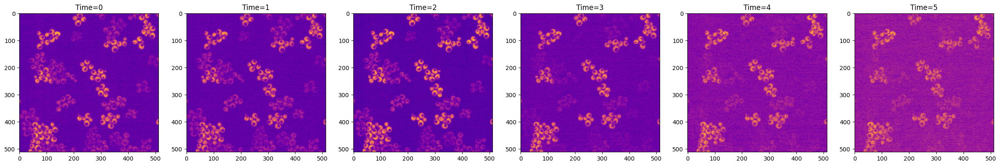

In [12]:
img_stack_gfp=[]
img_stack_perceval=[]

files=os.listdir(data_directory)

for i in range(1,52,1):
    file_loc_gfp=data_directory+"yPN2_w3488 laser 25r_s"+str(s)+"_t"+str(i)+".TIF"
    file_loc_perceval=data_directory+"yPN2_w2Perceval-HR-50_s"+str(s)+"_t"+str(i)+".TIF"
    img_stack_gfp.append(imread(file_loc_gfp).astype('int32'))
    img_stack_perceval.append(imread(file_loc_perceval).astype('int32'))

file_gfp = np.stack(img_stack_gfp)
file_perceval = np.stack(img_stack_perceval)

# file_gfp_corr=rolling_ball_subtract(file_gfp,radius=50)
# file_perceval_corr=rolling_ball_subtract(file_perceval,radius=50)

ratio = file_gfp / file_perceval


# ratio=file_gfp/file_perceval

np.save(save_directory+"percevalHR"+str(s),ratio)

fig,ax=plt.subplots(nrows=1,ncols=6,figsize=(30,12))
for i in range(6):
    ax[int(i)].imshow(ratio[i,:,:], cmap='plasma')
    ax[int(i)].set_title("Time="+str(i))

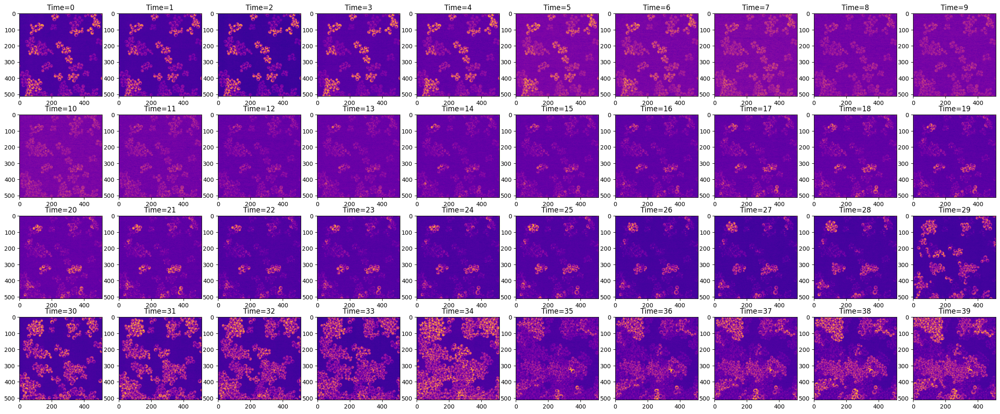

In [13]:
img_stack_cherry=[]
img_stack_gfp=[]

files=os.listdir(data_directory)

for i in range(1,52,1):
    file_loc_gfp=data_directory+"yPN2_w3488 laser 25r_s"+str(s)+"_t"+str(i)+".TIF"
    file_loc_mcherry=data_directory+"yPN2_w4594 laser 50_s"+str(s)+"_t"+str(i)+".TIF"
    img_stack_gfp.append(imread(file_loc_gfp).astype('int16'))
    img_stack_cherry.append(imread(file_loc_mcherry).astype('int32'))

file_gfp = np.stack(img_stack_gfp)
file_cherry = np.stack(img_stack_cherry)

# Reference: first frame
reference_frame = file_gfp[0, :, :]

# Histogram-match all frames to the first frame
file_gfp_corrected = np.zeros_like(file_gfp)

for i in range(file_gfp.shape[0]):
    file_gfp_corrected[i, :, :] = match_histograms(
        file_gfp[i, :, :], 
        reference_frame, 
        channel_axis=None
    )

ratio_ph=file_gfp

np.save(save_directory+"superecliptic_phluorin"+str(s),ratio_ph)

fig,ax=plt.subplots(nrows=4,ncols=10,figsize=(30,12))
for i in range(40):
    ax[int(i/10),int(i%10)].imshow(ratio_ph[i,:,:], cmap='plasma')
    ax[int(i/10),int(i%10)].set_title("Time="+str(i))

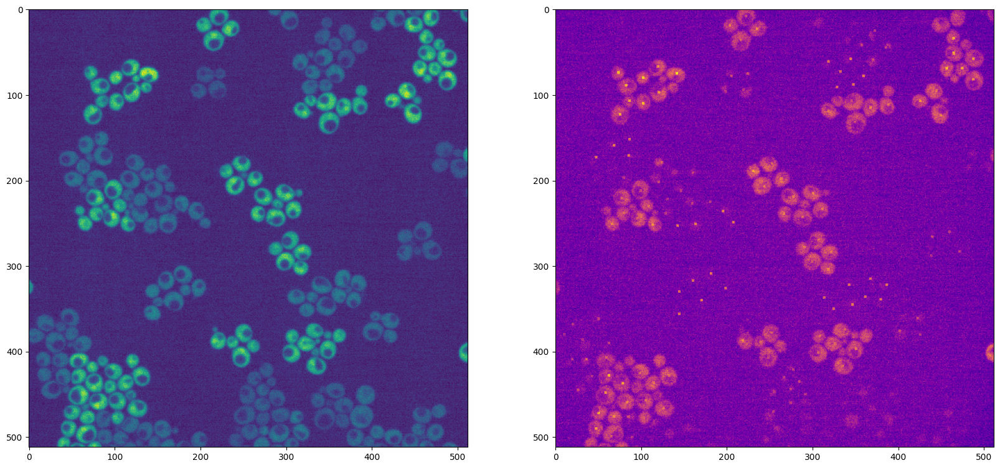

In [14]:
label_loc='Labels'+str(s)+'.tif'
labels=imread(save_directory+label_loc)[0]

fig,ax=plt.subplots(nrows=1,ncols=2,figsize=(20,10))
ax[0].imshow(ratio_ph[0,:,:])
ax[1].imshow(file_cherry[0,:,:]*0.3+10*labels,cmap='plasma')

In [25]:
mask=masks[0]
val_ph=[]
val_perceval=[]
file_cherry_zero=file_cherry[0]
for i in range(mask.max()):
    cell=[]
    if((file_cherry_zero[mask==i].mean()-file_cherry_zero[mask==0].mean())>15):
        for gfp,mch in zip(file_gfp,file_cherry):
            cell.append((gfp[mask==i].mean()-gfp[mask==0].min())/(mch[mask==i].mean()-mch[mask==0].min()))

        val_ph.append(cell)
    else:
        for gfp,per in zip(file_gfp,file_perceval):
            cell.append(((gfp[mask==i].mean()-gfp[mask==0].min())/(per[mask==i].mean()-per[mask==0].min())))  

        val_perceval.append(cell)
val_perceval_arr=np.array(val_perceval)
val_ph_arr=np.array(val_ph)

In [26]:
red_arr=[]
for j in range(mask.max()):
    red_arr.append(file_cherry_zero[mask==j].mean()-file_cherry_zero[mask==0].mean())

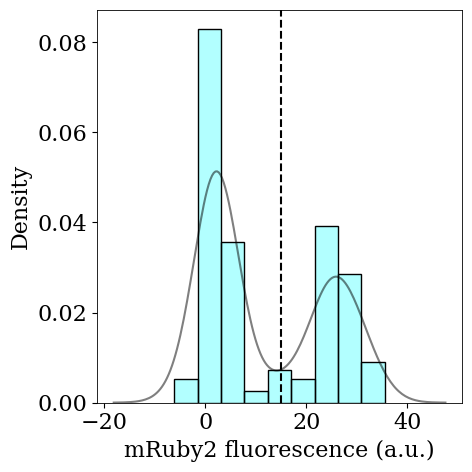

In [27]:
plt.rcParams['font.sans-serif'] = ['Nimbus Sans']
plt.rcParams['font.size'] = 16
plt.rcParams['axes.linewidth'] = 0.6
plt.figure(figsize=(5,5))
sns.histplot(red_arr,stat="density",
    color='cyan', alpha=0.3, edgecolor="k")
sns.kdeplot(red_arr,color='k', alpha=0.5)
plt.xlabel('mRuby2 fluorescence (a.u.)')
plt.axvline(15,color='k',linestyle='--')
plt.tight_layout()
plt.savefig(save_directory+'mruby2_bimodality.png',dpi=1200)

## Process Mask Function

## Masks to Tracks

In [28]:
masks_list=masks
tracks,df=process_masks(masks_list)

In [29]:
df_tracks = pd.DataFrame(tracks)
df_tracks

,prev_frame_label,curr_frame_label,frame
0,1.0,1,1
1,5.0,5,1
2,7.0,7,1
3,10.0,13,1
4,11.0,11,1
...,...,...,...
13308,68.0,31,50
13309,69.0,33,50
13310,71.0,34,50
13311,73.0,35,50


In [30]:
label_loc='Labels'+str(s)+'.tif'
labels=imread(save_directory+label_loc)[0]

masks = masks_list[0]

# Get coordinates where labels exist (non-zero)
label_coords = np.where(labels > 0)
label_values = labels[label_coords]

# For each label pixel, find which mask it belongs to
mask_values_at_labels = masks[label_coords]

# Create mapping
df = pd.DataFrame({
    'mask_id': mask_values_at_labels,
    'label': label_values
})

# Remove background masks (mask_id == 0)
df = df[df['mask_id'] > 0]

# Get one label per mask (most common)
df = df.groupby('mask_id')['label'].agg(lambda x: x.mode()[0]).reset_index()


In [31]:
G = nx.DiGraph()
for _, row in df_tracks.iterrows():
    if pd.notna(row['prev_frame_label']):
        parent = (row['frame']-1, int(row['prev_frame_label']))
        child = (row['frame'], int(row['curr_frame_label']))
        G.add_edge(parent, child)

# Find all root nodes (no predecessors)
roots = [node for node in G.nodes() if G.in_degree(node) == 0]

# Extract lineages from each root
lineages = []
for root in roots:
    # Get all paths from this root (handles divisions)
    descendants = nx.descendants(G, root)
    descendants.add(root)
    subgraph = G.subgraph(descendants)
    
    # Get all terminal nodes (leaves) in this lineage
    leaves = [node for node in subgraph.nodes() if subgraph.out_degree(node) == 0]
    
    # Get path from root to each leaf
    for leaf in leaves:
        path = nx.shortest_path(G, root, leaf)
        lineage_ids = [node[1] for node in path]  # Extract just the label IDs
        lineages.append(lineage_ids)

In [32]:
roots=[]
for l in lineages:
    if(len(l)>=33):
        roots.append(l[0])
len(roots)

181

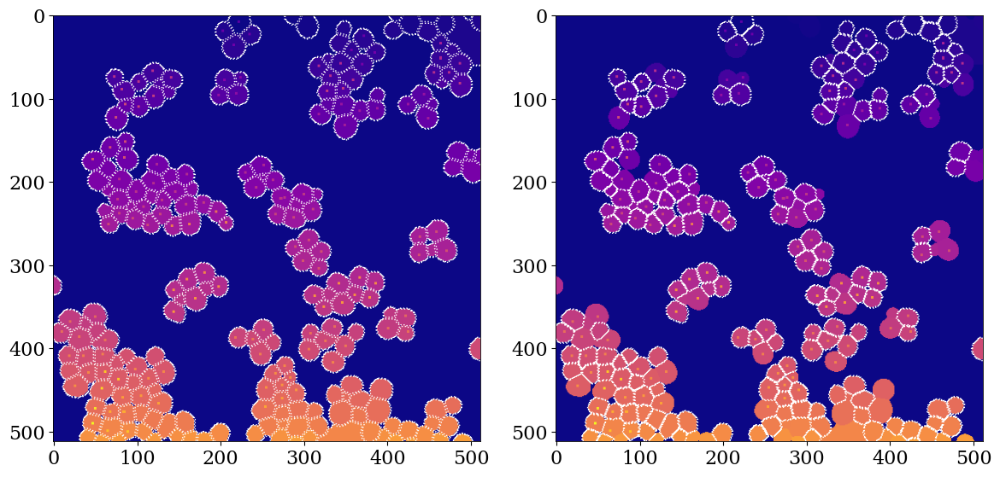

In [33]:
plt.rc('font',family='serif')
fig,ax=plt.subplots(nrows=1,ncols=2,figsize=(12,8))
for i in range(len(roots)): 
    ax[1].imshow(masks*0.1+5*labels,cmap='plasma')
    boundaries = find_boundaries(masks==roots[i], mode='outer')
    ax[1].contour(boundaries, levels=[0.5], colors='white', linewidths=1, linestyles='dotted')
ax[0].imshow(5*labels+0.1*masks,cmap='plasma')
boundaries = find_boundaries(masks, mode='outer')
ax[0].contour(boundaries, levels=[0.5], colors='white', linewidths=1, linestyles='dotted')
fig.tight_layout()
# fig.savefig(save_directory+'segmentation_tracking.png',dpi=1200)

In [34]:
perceval_hr_arr=[]
perceval_hr_rec=[]
ph_hr_arr=[]
ph_hr_rec=[]

state=[]

t=35

masks_arr_20=masks_arr

q=95

for l in lineages:
    
    if(len(l)>t):
   
        ratio_vals_phr=[]
        ratio_vals_ph=[]
        
        if((file_cherry[0][masks_arr_20[0,:,:]==l[0]].mean()-file_cherry[0][masks_arr_20[0,:,:]==0].mean())<15):

            for i in range(t):

                gfp_arr=file_gfp[i]
                perc_arr=file_perceval[i]

                vals = gfp_arr[masks_arr_20[i, :, :] == l[i]]
                if vals.size > 0:
                    num = np.percentile(vals, q)
                else:
                    num = np.nan  # or continue
                
                vals2 = perc_arr[masks_arr_20[i, :, :] == l[i]]
                if vals2.size > 0:
                    den = np.percentile(vals2, q)
                else:
                    den = np.nan  # or continue
                
                ratio_vals_phr.append(num / den)

                # ratio_vals_phr.append(np.percentile(gfp_arr[masks_arr_20[i,:,:]==l[i]],90)
                #                   /np.percentile(perc_arr[masks_arr_20[i,:,:]==l[i]],90))

                                 
            
            if(list(df.loc[df['mask_id']==l[0],'label'])==[1]):
                perceval_hr_arr.append(ratio_vals_phr)
                
            elif(list(df.loc[df['mask_id']==l[0],'label'])==[2]):
                perceval_hr_rec.append(ratio_vals_phr)
                
        
        else: 
            
            for i in range(t):

                gfp_arr=file_gfp[i]
                mch_arr=file_cherry[i]

                # vals = gfp_arr[masks_arr_20[i, :, :] == l[i]]
                # if vals.size > 0:
                #     ratio_vals_ph.append(vals.mean())
                # else:
                #     ratio_vals_ph.append(np.nan)  # or skip this timepoint

            
                # ratio_vals_ph.append(np.median(gfp_arr[masks_arr_20[i,:,:]==l[i]])
                #       /np.median(mch_arr[masks_arr_20[i,:,:]==l[i]]))

                ratio_vals_ph.append((gfp_arr[masks_arr_20[i,:,:]==l[i]].mean())-(gfp_arr[masks_arr_20[i,:,:]==0].mean()))
                
            if(list(df.loc[df['mask_id']==l[0],'label'])==[1]):
                ph_hr_arr.append(ratio_vals_ph)

            elif(list(df.loc[df['mask_id']==l[0],'label'])==[2]):
                ph_hr_rec.append(ratio_vals_ph)

/tmp/ipykernel_2596299/1008811783.py:71: RuntimeWarning: Mean of empty slice
  ratio_vals_ph.append((gfp_arr[masks_arr_20[i,:,:]==l[i]].mean())-(gfp_arr[masks_arr_20[i,:,:]==0].mean()))
/n/home01/pnandabbs/DCS/Manuscript/Figure1/Figure1A_ATP_ADP/cellpose/lib64/python3.12/site-packages/numpy/_core/_methods.py:142: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [35]:
ph_arr=np.array(ph_hr_arr)
ph_rec=np.array(ph_hr_rec)

norm_ph_arr=ph_arr.transpose()
norm_ph_rec=ph_rec.transpose()

per_arr=np.array(perceval_hr_arr)
per_rec=np.array(perceval_hr_rec)

norm_arr=per_arr.transpose()
norm_rec=per_rec.transpose()

tb1=5
tb2=23
tb3=35
m1=0.00015     #m=0.00015
c1=-0.00146373

perceval_ph_corr_arr_pre=norm_arr[0:tb1]-(m1*np.nanmean(-norm_ph_arr[0:tb1]+norm_ph_arr[0],axis=1).reshape(-1,1)+c1)
perceval_ph_corr_rec_pre=norm_rec[0:tb1]-(m1*np.nanmean(-norm_ph_rec[0:tb1]+norm_ph_rec[0],axis=1).reshape(-1,1)+c1)

perceval_ph_corr_arr_post1=norm_arr[tb1:tb2]-(m1*np.nanmean(-norm_ph_arr[tb1:tb2]+norm_ph_arr[0],axis=1).reshape(-1,1)+c1)
perceval_ph_corr_rec_post1=norm_rec[tb1:tb2]-(m1*np.nanmean(-norm_ph_rec[tb1:tb2]+norm_ph_rec[0],axis=1).reshape(-1,1)+c1)

perceval_ph_corr_arr_post2=norm_arr[tb2:tb3]-(m1*np.nanmean(-norm_ph_arr[tb2:tb3]+norm_ph_arr[0],axis=1).reshape(-1,1)+c1)
perceval_ph_corr_rec_post2=norm_rec[tb2:tb3]-(m1*np.nanmean(-norm_ph_rec[tb2:tb3]+norm_ph_rec[0],axis=1).reshape(-1,1)+c1)

perceval_ph_corr_arr=np.concat([perceval_ph_corr_arr_pre,perceval_ph_corr_arr_post1,perceval_ph_corr_arr_post2])
perceval_ph_corr_rec=np.concat([perceval_ph_corr_rec_pre,perceval_ph_corr_rec_post1,perceval_ph_corr_rec_post2])

# perceval_ph_corr_arr=np.concat([perceval_ph_corr_arr_pre,perceval_ph_corr_arr_post1])
# perceval_ph_corr_rec=np.concat([perceval_ph_corr_rec_pre,perceval_ph_corr_rec_post1])

n_arr=perceval_ph_corr_arr.shape[1]
n_rec=perceval_ph_corr_rec.shape[1]

frac_arr=perceval_ph_corr_arr
frac_rec=perceval_ph_corr_rec

# fractional occupancy
# frac_arr = (perceval_ph_corr_arr-(1))/(0.03)
# frac_rec = (perceval_ph_corr_rec-(1))/(0.03)


In [36]:
len(norm_ph_arr)

35

In [37]:
len(norm_ph_rec)

35

In [38]:
import numpy as np

# Calibration: absolute ratios and signals
r0, r15 = 2.86, 0.76      # ATP:ADP at t=0 and t=15
s0, s15 = 1.02, 0.99  # Perceval signal at t=0 and t=15

# Precompute slope
m = (r15 - r0) / (s15 - s0)
b = r0 - m * s0

def ratio_from_signal_linear(s):
    s = np.asarray(s, float)
    return m * s + b

# Example: convert any signal array (bulk, frac_arr, frac_rec)
r_arr = ratio_from_signal_linear(frac_arr)
r_rec = ratio_from_signal_linear(frac_rec)


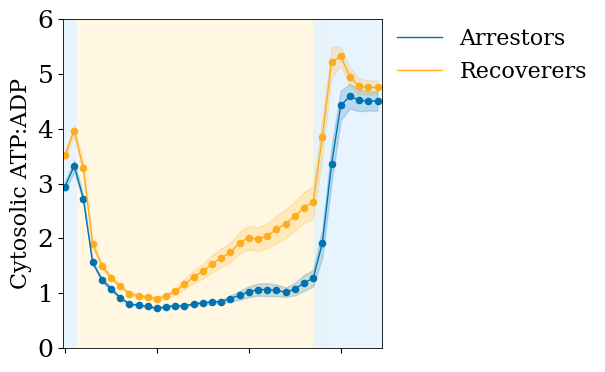

In [39]:
plt.rc('font',family='serif')

fig,ax1=plt.subplots(figsize=(8,4))

w=2
o=0

t=tb3

ax1.bar([0.5],[7],width=1.6,color='#E3F2FD',alpha=0.8)
ax1.bar([14.8],[7],width=27,color='#FFF3CD',alpha=0.6)
ax1.bar([33],[7],width=12,color='#E3F2FD',alpha=0.8)

ax1.plot(np.arange(0,t),savgol_filter(np.nanmean(r_arr,axis=1),w,o),color='#0072B2',linewidth=1)
ax1.plot(np.arange(0,t),savgol_filter(np.nanmean(r_rec,axis=1),w,o),color='#FFAC1C',linewidth=1)

ax1.legend(
    ['Arrestors', 'Recoverers'],
    loc='upper left',
    bbox_to_anchor=(1.02, 1.0),  # outside to the right
    borderaxespad=0.,
    frameon=False,
)

ax1.fill_between(np.arange(0,t),savgol_filter(np.nanmean(r_arr,axis=1)-(np.nanstd(r_arr,axis=1)/np.sqrt(n_arr)),w,o),savgol_filter(np.nanmean(r_arr,axis=1)+(np.nanstd(r_arr,axis=1)/np.sqrt(n_arr)),w,o),color='#0072B2',alpha=0.2)
ax1.fill_between(np.arange(0,t),savgol_filter(np.nanmean(r_rec,axis=1)-(np.nanstd(r_rec,axis=1)/np.sqrt(n_rec)),w,o),savgol_filter(np.nanmean(r_rec,axis=1)+(np.nanstd(r_rec,axis=1)/np.sqrt(n_rec)),w,o),color='#FFAC1C',alpha=0.2)

ax1.scatter(np.arange(0,t),savgol_filter(np.nanmean(r_arr,axis=1),w,o),color='#0072B2',s=20)
ax1.scatter(np.arange(0,t),savgol_filter(np.nanmean(r_rec,axis=1),w,o),color='#FFAC1C',s=20)

# ax1.plot(np.arange(0,t),savgol_filter(np.nanmean(perceval_ph_corr_arr,axis=1),w,o),color='#0072B2',linewidth=1)
# ax1.plot(np.arange(0,t),savgol_filter(np.nanmean(perceval_ph_corr_rec,axis=1),w,o),color='#FFAC1C',linewidth=1)

ax1.set_xticklabels([],fontsize=12)
ax1.tick_params(axis='y', labelsize=18)


ax1.set_ylabel('Cytosolic ATP:ADP',fontsize=16)
# ax2.set_ylabel('pH (--)',fontsize=20)

ax1.set_ylim([0,6])
# ax2.set_ylim([2010,2150])
ax1.set_xlim([-0.2,34.5])
# ax1.set_yscale('log')

fig.tight_layout(rect=[0, 0, 0.8, 1])  # leave room on the right
fig.savefig(save_directory+'Figure1B_PercevalHR_Final.png',dpi=1200)

In [40]:
pka, A, B = 7.85437315, 477.11302705,   5.7261474   # from curve_fit

def pH_from_signal(y, pka=pka, A=A, B=B):
    z = (y - B) / A
    return pka + np.log10(z / (1 - z))


In [41]:
abs_ph_arr=pH_from_signal(norm_ph_arr)
abs_ph_rec=pH_from_signal(norm_ph_rec)

/tmp/ipykernel_2596299/2441114235.py:5: RuntimeWarning: invalid value encountered in log10
  return pka + np.log10(z / (1 - z))


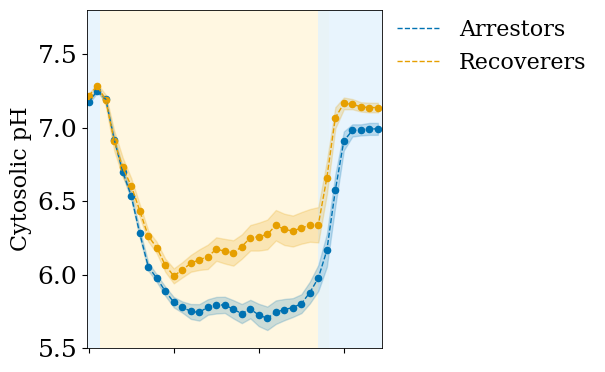

In [42]:
plt.rc('font',family='serif')

fig,ax1=plt.subplots(figsize=(8,4))
 
w=2
o=0

t=tb3

ax1.bar([0.5],[8],width=1.6,color='#E3F2FD',alpha=0.8)
ax1.bar([14.8],[8],width=27,color='#FFF3CD',alpha=0.6)
ax1.bar([33],[8],width=12,color='#E3F2FD',alpha=0.8)

ax1.plot(np.arange(0,t),savgol_filter(np.nanmean(abs_ph_arr,axis=1),w,o),color='#0072B2',linestyle='--',linewidth=1)
ax1.plot(np.arange(0,t),savgol_filter(np.nanmean(abs_ph_rec,axis=1),w,o),color='#E69F00',linestyle='--',linewidth=1)

ax1.legend(
    ['Arrestors', 'Recoverers'],
    loc='upper left',
    bbox_to_anchor=(1.02, 1.0),  # outside to the right
    borderaxespad=0.,
    frameon=False,
)

ax1.fill_between(np.arange(0,t),savgol_filter(np.nanmean(abs_ph_arr,axis=1)-(np.nanstd(abs_ph_arr,axis=1)/np.sqrt(n_arr)),w,o),savgol_filter(np.nanmean(abs_ph_arr,axis=1)+(np.nanstd(abs_ph_arr,axis=1)/np.sqrt(n_arr)),w,o),color='#0072B2',alpha=0.2)
ax1.fill_between(np.arange(0,t),savgol_filter(np.nanmean(abs_ph_rec,axis=1)-(np.nanstd(abs_ph_rec,axis=1)/np.sqrt(n_rec)),w,o),savgol_filter(np.nanmean(abs_ph_rec,axis=1)+(np.nanstd(abs_ph_rec,axis=1)/np.sqrt(n_rec)),w,o),color='#E69F00',alpha=0.2)

ax1.scatter(np.arange(0,t),savgol_filter(np.nanmean(abs_ph_arr,axis=1),w,o),color='#0072B2',s=20)
ax1.scatter(np.arange(0,t),savgol_filter(np.nanmean(abs_ph_rec,axis=1),w,o),color='#E69F00',s=20)

ax1.set_xticklabels([],fontsize=12)
ax1.tick_params(axis='y', labelsize=18)

ax1.set_ylabel('Cytosolic pH',fontsize=16)
# ax2.set_ylabel('pH (--)',fontsize=20)

ax1.set_ylim([5.5,7.8])
# ax1.set_ylim([2010,2140])
ax1.set_xlim([-0.2,34.5])
# ax1.set_yscale('log')

fig.tight_layout(rect=[0, 0, 0.8, 1])  # leave room on the right
fig.savefig(save_directory+'Figure1B_pH_Final.png',dpi=1200)

In [43]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

frame_interval_s = 20.0
frame_interval_min = frame_interval_s / 60.0

n_frames = r_arr.shape[0]
frames = np.arange(n_frames)            # 0,1,2,...
t_all = frames * frame_interval_min     # time in minutes


In [44]:
# window: frames 3..7
frame_win = np.arange(2, 7)  # 3,4,5,6,7
t_win = frame_win * frame_interval_min

r_arr_mean = np.nanmean(r_arr, axis=1)
r_rec_mean = np.nanmean(r_rec, axis=1)

r_arr_win = r_arr_mean[frame_win]
r_rec_win = r_rec_mean[frame_win]

def exp_decay(t, A, tau, C):
    return A * np.exp(-t / tau) + C     # tau in minutes

p0_arr = [r_arr_win[0] - r_arr_win[-1], 1.0, r_arr_win[-1]]
p0_rec = [r_rec_win[0] - r_rec_win[-1], 1.0, r_rec_win[-1]]

popt_arr, pcov_arr = curve_fit(exp_decay, t_win, r_arr_win, p0=p0_arr)
popt_rec, pcov_rec = curve_fit(exp_decay, t_win, r_rec_win, p0=p0_rec)

A_arr, tau_arr_min, C_arr = popt_arr
A_rec, tau_rec_min, C_rec = popt_rec

tau_arr_s = tau_arr_min * 60.0
tau_rec_s = tau_rec_min * 60.0

perr_arr = np.sqrt(np.diag(pcov_arr))   # [σ_A, σ_tau, σ_C]
perr_rec = np.sqrt(np.diag(pcov_rec))
sigma_A_arr, sigma_tau_arr, sigma_C_arr = perr_arr
sigma_A_rec, sigma_tau_rec, sigma_C_rec = perr_rec


In [45]:
sigma_A_arr, sigma_tau_arr, sigma_C_arr

(np.float64(7.345185914439715),
 np.float64(0.027955667588960294),
 np.float64(0.06188597377543184))

In [46]:
sigma_A_rec, sigma_tau_rec, sigma_C_rec

(np.float64(10.977557670968057),
 np.float64(0.035623235241972265),
 np.float64(0.09497855965590604))

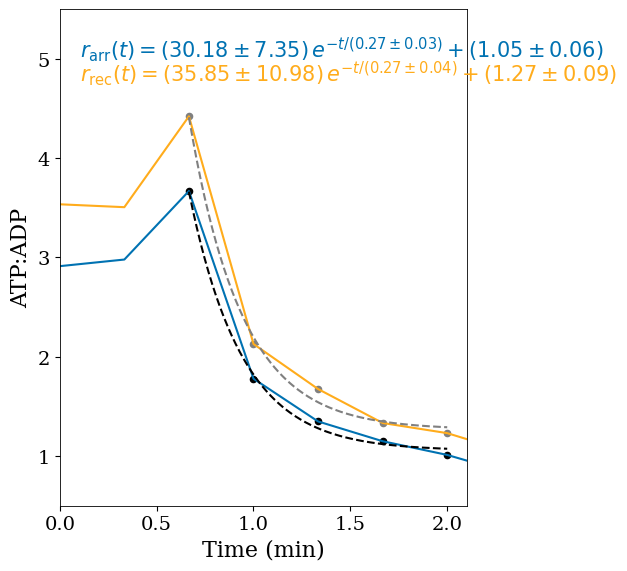

<Figure size 300x300 with 0 Axes>

In [47]:
t_fine = np.linspace(frame_win[0]*frame_interval_min,
                     frame_win[-1]*frame_interval_min, 200)
r_arr_fit_fine = exp_decay(t_fine, *popt_arr)
r_rec_fit_fine = exp_decay(t_fine, *popt_rec)

# eq_arr = r"$r_{\mathrm{arr}}(t) = %.2f\,e^{-t/%.2f} + %.2f$" % (A_arr, tau_arr_min, C_arr)
# eq_rec = r"$r_{\mathrm{rec}}(t) = %.2f\,e^{-t/%.2f} + %.2f$" % (A_rec, tau_rec_min, C_rec)

eq_arr = r"$r_{\mathrm{arr}}(t) = (%.2f \pm %.2f)\,e^{-t/(%.2f \pm %.2f)} + (%.2f \pm %.2f)$" % (
    A_arr, sigma_A_arr, tau_arr_min, sigma_tau_arr, C_arr, sigma_C_arr
)

eq_rec = r"$r_{\mathrm{rec}}(t) = (%.2f \pm %.2f)\,e^{-t/(%.2f \pm %.2f)} + (%.2f \pm %.2f)$" % (
    A_rec, sigma_A_rec, tau_rec_min, sigma_tau_rec, C_rec, sigma_C_rec
)

plt.figure(figsize=(6, 6))
plt.plot(t_all, r_arr_mean, color="#0072B2", label="arr mean")
plt.plot(t_all, r_rec_mean, color="#FFAC1C", label="rec mean")
plt.scatter(t_win, r_arr_win, color="black", s=20, label="arr 3–7 frames")
plt.scatter(t_win, r_rec_win, color="gray", s=20, label="rec 3–7 frames")
plt.plot(t_fine, r_arr_fit_fine, color="black", label="arr exp fit",linestyle='--')
plt.plot(t_fine, r_rec_fit_fine, color="gray", label="rec exp fit",linestyle='--')
plt.xlabel("Time (min)",fontsize=16)
plt.ylabel("ATP:ADP",fontsize=16)

plt.text(
    0.05, 0.90,
    eq_rec,
    transform=plt.gca().transAxes,
    va="top", ha="left",
    fontsize=15,
    color="#FFAC1C",  # rec color
)

plt.text(
    0.05, 0.95,
    eq_arr,
    transform=plt.gca().transAxes,
    va="top", ha="left",
    fontsize=15,
    color="#0072B2",  # arr color
)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlim(0,2.1)
plt.ylim(0.5,5.5)
# plt.legend(frameon=False)
plt.tight_layout()
plt.show()
plt.savefig(save_directory+'Figure1B_decline.png',dpi=300)

# Glucose Prepulse

In [48]:
data_directory_calib='/n/boslfs02/LABS/murray_lab/Users/pnanda/DCS/Manuscript/eDCS035_PercevalHR_SEP_Full/Calibration_Day2/'
files=os.listdir(data_directory_calib)

In [49]:
img_stack=[]
files=os.listdir(data_directory_calib)
# 3
s=1

for i in range(1,16,1):
    file_loc=data_directory_calib+"yPN_glu2_w1Brightfield confocal_s"+str(s)+"_t"+str(i)+".TIF"
    img_stack.append(imread(file_loc).astype('int16'))

file = np.stack(img_stack)

num_cells=[]
masks=[]
for i in range(len(file)):
    masks_zero, flows, diams = model.eval(file[i], diameter=50)
    num_cells.append(masks_zero.max())
    masks.append(masks_zero)

masks_arr=np.array(masks)

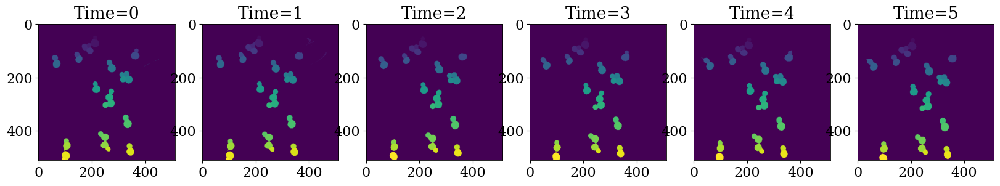

In [50]:
fig,ax=plt.subplots(nrows=1,ncols=6,figsize=(20,10))
for i in range(6):
    ax[i].imshow(masks_arr[i], cmap='viridis')
    ax[i].set_title("Time="+str(i))

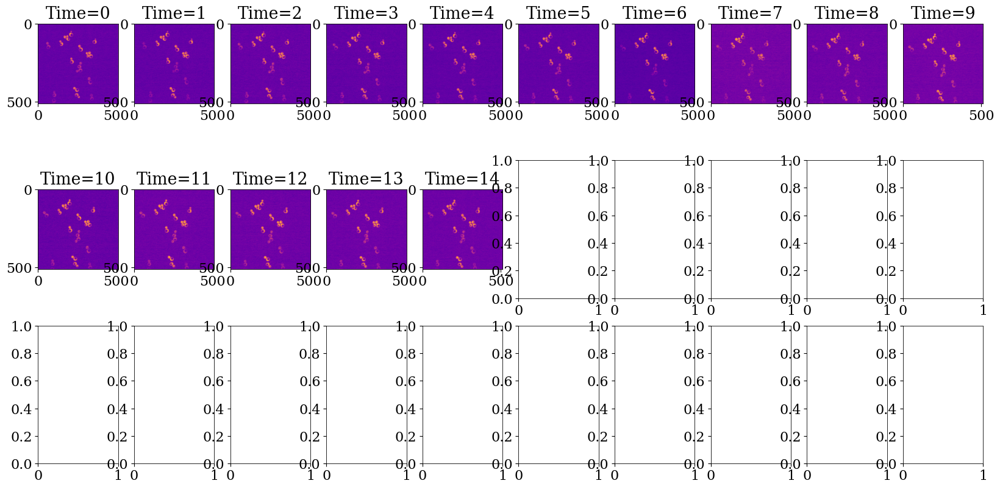

In [51]:
img_stack_gfp=[]
img_stack_perceval=[]

files=os.listdir(data_directory_calib)


for i in range(1,16,1):
    file_loc_gfp=data_directory_calib+"yPN_glu2_w3488 laser 25r_s"+str(s)+"_t"+str(i)+".TIF"
    file_loc_perceval=data_directory_calib+"yPN_glu2_w2Perceval-HR-50_s"+str(s)+"_t"+str(i)+".TIF"
    img_stack_gfp.append(imread(file_loc_gfp).astype('int16'))
    img_stack_perceval.append(imread(file_loc_perceval).astype('int16'))

file_gfp = np.stack(img_stack_gfp)
file_perceval = np.stack(img_stack_perceval)

ratio=file_gfp/file_perceval

fig,ax=plt.subplots(nrows=3,ncols=10,figsize=(20,10))
for i in range(15):
    ax[int(i/10),int(i%10)].imshow(ratio[i,:,:], cmap='plasma')
    ax[int(i/10),int(i%10)].set_title("Time="+str(i))

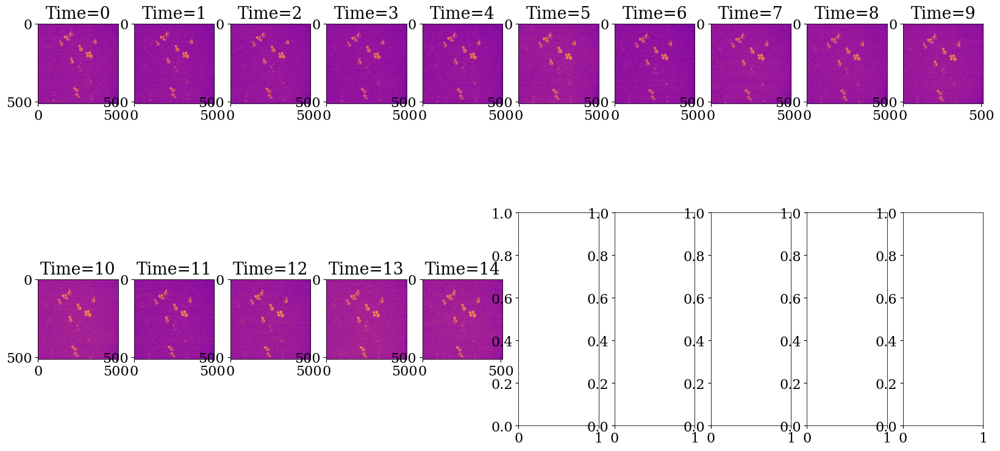

In [52]:
img_stack_cherry=[]
img_stack_gfp=[]

files=os.listdir(data_directory_calib)

for i in range(1,16,1):
    file_loc_gfp=data_directory_calib+"yPN_glu2_w3488 laser 25r_s"+str(s)+"_t"+str(i)+".TIF"
    file_loc_mcherry=data_directory_calib+"yPN_glu2_w4594 laser 50_s"+str(s)+"_t"+str(i)+".TIF"
    img_stack_gfp.append(imread(file_loc_gfp).astype('int16'))
    img_stack_cherry.append(imread(file_loc_mcherry).astype('int16'))

file_gfp = np.stack(img_stack_gfp)
file_cherry = np.stack(img_stack_cherry)

ratio_ph=file_cherry


fig,ax=plt.subplots(nrows=2,ncols=10,figsize=(20,10))
for i in range(15):
    ax[int(i/10),int(i%10)].imshow(ratio_ph[i], cmap='plasma')
    ax[int(i/10),int(i%10)].set_title("Time="+str(i))

In [53]:
mask=masks[0]
val_ph=[]
val_perceval=[]
file_cherry_zero=file_cherry[0]
for i in range(mask.max()):
    cell=[]
    mch_val=(file_cherry_zero[mask==i].mean()-file_cherry_zero[mask==0].min())
    print(mch_val)
    if(mch_val<50.0):
        for gfp,per in zip(file_gfp,file_perceval):
            cell.append(((gfp[mask==i].mean())/(per[mask==i].mean())))  
        val_perceval.append(cell)
    else:
        for gfp,mch in zip(file_gfp,file_cherry):
            cell.append(gfp[mask==i].mean()/mch[mask==i].mean())
        val_ph.append(cell)
val_perceval_arr_calib=np.array(val_perceval)
val_ph_arr_calib=np.array(val_ph)

39.59298941583893
47.952631578947376
58.013698630137014
56.95238095238096
64.06190476190477
61.549494949495056
48.01570680628265
54.97682119205297
59.35602836879434
39.960835509138406
58.51102941176464
40.66666666666674
42.40588235294126
63.284122562674156
63.49519890260626
69.62912087912082
67.0957854406131
67.24531249999995
67.42416452442149
60.578125
61.48006134969319
44.27220630372494
46.156829679595376
44.636070853462115
41.67826086956529
42.44191919191917
45.129921259842604
64.10839160839168
61.02777777777783
42.00393700787413
57.052810902896
41.70120120120123
43.62536873156341
56.22556390977434
44.74732006125578
44.30583214793751


In [54]:
len(val_perceval_arr_calib)

17

In [55]:
len(val_ph_arr_calib)

19

In [56]:
red_arr=[]
for j in range(mask.max()):
    red_arr.append(file_cherry_zero[mask==j].mean()-file_cherry_zero[mask==0].min())

<Axes: ylabel='Density'>

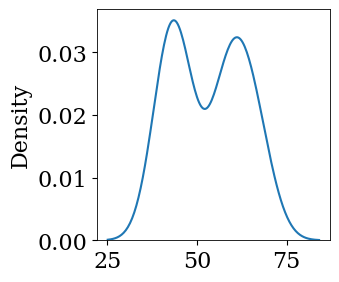

In [57]:
sns.kdeplot(red_arr)

In [58]:
masks_list=masks
tracks,df=process_masks(masks_list)

In [59]:
df_tracks = pd.DataFrame(tracks)
df_tracks

,prev_frame_label,curr_frame_label,frame
0,3.0,4,1
1,4.0,5,1
2,5.0,6,1
3,7.0,8,1
4,9.0,9,1
...,...,...,...
254,26.0,27,14
255,28.0,29,14
256,31.0,32,14
257,32.0,33,14


In [60]:
G = nx.DiGraph()
for _, row in df_tracks.iterrows():
    if pd.notna(row['prev_frame_label']):
        parent = (row['frame']-1, int(row['prev_frame_label']))
        child = (row['frame'], int(row['curr_frame_label']))
        G.add_edge(parent, child)

# Find all root nodes (no predecessors)
roots = [node for node in G.nodes() if G.in_degree(node) == 0]

# Extract lineages from each root
lineages = []
for root in roots:
    # Get all paths from this root (handles divisions)
    descendants = nx.descendants(G, root)
    descendants.add(root)
    subgraph = G.subgraph(descendants)
    
    # Get all terminal nodes (leaves) in this lineage
    leaves = [node for node in subgraph.nodes() if subgraph.out_degree(node) == 0]
    
    # Get path from root to each leaf
    for leaf in leaves:
        path = nx.shortest_path(G, root, leaf)
        lineage_ids = [node[1] for node in path]  # Extract just the label IDs
        lineages.append(lineage_ids)

In [61]:
roots=[]
for l in lineages:
    if(len(l)>=15):
        roots.append(l[0])
len(roots)

17

In [62]:
perceval_hr=[]
ph_hr=[]

state=[]

t=15

masks_arr_20=masks_arr

for l in lineages:
    
    if(len(l)>=t):
   
        ratio_vals_phr=[]
        ratio_vals_ph=[]
        
        if((file_cherry[0][masks_arr_20[0,:,:]==l[0]].mean()-file_cherry[0][masks_arr_20[0,:,:]==0].min())<50):

            for i in range(t):

                gfp_arr=file_gfp[i]
                perc_arr=file_perceval[i]

                vals = gfp_arr[masks_arr_20[i, :, :] == l[i]]
                
                if vals.size > 0:
                    num = np.percentile(vals, q)
                else:
                    num = np.nan  # or continue
                
                vals2 = perc_arr[masks_arr_20[i, :, :] == l[i]]
                if vals2.size > 0:
                    den = np.percentile(vals2, q)
                else:
                    den = np.nan  # or continue
                
                ratio_vals_phr.append(num / den)


                # ratio_vals_phr.append((gfp_arr[masks_arr_20[i,:,:]==l[i]].mean()-gfp_arr[masks_arr_20[i,:,:]==0].mean())
                #                   /(perc_arr[masks_arr_20[i,:,:]==l[i]].mean()-perc_arr[masks_arr_20[i,:,:]==0].mean()))

                       
            
            perceval_hr.append(ratio_vals_phr)                
        
        else: 
            
            for i in range(t):

                gfp_arr=file_gfp[i]
                mch_arr=file_cherry[i]

                vals = gfp_arr[masks_arr_20[i, :, :] == l[i]]
                if vals.size > 0:
                    ratio_vals_ph.append(vals.mean())
                else:
                    ratio_vals_ph.append(np.nan)  # or skip this timepoint

                    
                # ratio_vals_ph.append(np.median(gfp_arr[masks_arr_20[i,:,:]==l[i]])
                #       /np.median(mch_arr[masks_arr_20[i,:,:]==l[i]]))

                # ratio_vals_ph.append((gfp_arr[masks_arr_20[i,:,:]==l[i]].mean()-gfp_arr[masks_arr_20[i,:,:]==0].mean()))
                
            ph_hr.append(ratio_vals_ph)


In [63]:
ph=np.array(ph_hr)

norm_ph=ph.transpose()

per=np.array(perceval_hr)

norm=per.transpose()

perceval_ph_corr=norm

abs_ph=pH_from_signal(norm_ph)


/tmp/ipykernel_2596299/2441114235.py:5: RuntimeWarning: invalid value encountered in log10
  return pka + np.log10(z / (1 - z))


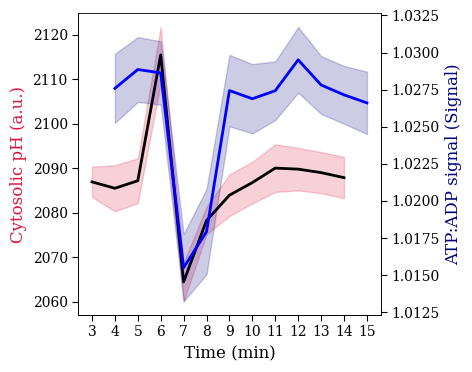

In [64]:
fig, ax = plt.subplots(1, 1, figsize=(5, 4))

start = 3
time_ph  = np.arange(start, 15, 1)
time_per = np.arange(start+1, 16, 1)

mean_ph = np.mean(norm_ph[start:], axis=1)
sem_ph  = np.std(norm_ph[start:], axis=1) / np.sqrt(norm_ph.shape[1])

median_per = np.median(norm[start:], axis=1)
sem_per    = np.std(norm[start:], axis=1) / np.sqrt(norm.shape[1])

ax.plot(time_ph, mean_ph, color="black", lw=2, label="pH (mean)")
ax.fill_between(time_ph, mean_ph - sem_ph, mean_ph + sem_ph,
                color="crimson", alpha=0.2)

ax.set_xlabel("Time (min)", fontsize=12)
ax.set_ylabel("Cytosolic pH (a.u.)", color="crimson", fontsize=12)

# unified tick sizes
ax.tick_params(axis="x", which="major", length=4, labelsize=10)
ax.tick_params(axis="y", which="major", length=4, labelsize=10)

ax.spines["top"].set_visible(False)

ax1 = ax.twinx()
ax1.plot(time_per, median_per, color="blue", lw=2, label="ATP:ADP (median)")
ax1.fill_between(time_per, median_per - sem_per, median_per + sem_per,
                 color="navy", alpha=0.2)

ax1.set_ylabel("ATP:ADP signal (Signal)", color="navy", fontsize=12)

# match right-axis tick size to left
ax1.tick_params(axis="y", which="major", length=4, labelsize=10)

# x ticks (once)
xticks = np.arange(3, 15.5, 1)
ax.set_xticks(xticks)

fig.tight_layout()
mpl.rcParams['svg.fonttype'] = 'none'
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['Arial']  # exists on Mac, Illustrator knows it


fig.savefig(save_directory+'glu_prepulse_calibration.svg',format="svg")

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

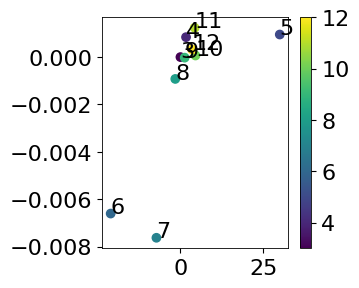

In [65]:
norm_ph_vals_d=np.mean(norm_ph,axis=1)
norm_per_vals_d=np.mean(norm,axis=1)
delta_pH_d=norm_ph_vals_d[4:14]-norm_ph_vals_d[4]
delta_per_d=norm_per_vals_d[3:13]-norm_per_vals_d[3]
plt.scatter(delta_pH_d,delta_per_d,c=np.arange(3,13,1))
j=0
for x,y in zip(delta_pH_d,delta_per_d):
    plt.annotate(np.arange(3,13,1)[j],(float(x),float(y)))
    j+=1
plt.colorbar()

In [66]:
x = norm_ph_vals_d[4:14]-norm_ph_vals_d[4] # shape (2, N)
y = norm_per_vals_d[3:13]-norm_per_vals_d[3]                                  # shape (N,)
popt, pcov = sp.optimize.curve_fit(perceval_pH_slope, x, y, method='lm')

In [67]:
popt

array([ 0.00017547, -0.00144637])